In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('/content/AirQualityUCI.csv')
df = df.replace(-200, pd.NA)

In [ ]:
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/3/2004,18.00.00,2.6,1360,150.0,11.9,1046,166,1056,113,1692,1268.0,13.6,48.9,0.7578
1,10/3/2004,19.00.00,2.0,1292,112.0,9.4,955,103,1174,92,1559,972.0,13.3,47.7,0.7255
2,10/3/2004,20.00.00,2.2,1402,88.0,9.0,939,131,1140,114,1555,1074.0,11.9,54.0,0.7502
3,10/3/2004,21.00.00,2.2,1376,80.0,9.2,948,172,1092,122,1584,1203.0,11.0,60.0,0.7867
4,10/3/2004,22.00.00,1.6,1272,51.0,6.5,836,131,1205,116,1490,1110.0,11.2,59.6,0.7888


In [ ]:
df.describe().T

,count,unique,top,freq
Date,9357,391,21/09/2004,24
Time,9357,26,18.00.00,390
CO(GT),7675.0,97.0,1.0,305.0
PT08.S1(CO),8990,1041,973,30
NMHC(GT),915.0,430.0,66.0,14.0
C6H6(GT),8991.0,408.0,3.6,84.0
PT08.S2(NMHC),8990,1245,853,25
NOx(GT),7719,925,89,41
PT08.S3(NOx),8990,1221,767,25
NO2(GT),7716,284,97,78


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Date           9357 non-null   object
 1   Time           9357 non-null   object
 2   CO(GT)         7675 non-null   object
 3   PT08.S1(CO)    8990 non-null   object
 4   NMHC(GT)       915 non-null    object
 5   C6H6(GT)       8991 non-null   object
 6   PT08.S2(NMHC)  8990 non-null   object
 7   NOx(GT)        7719 non-null   object
 8   PT08.S3(NOx)   8990 non-null   object
 9   NO2(GT)        7716 non-null   object
 10  PT08.S4(NO2)   8991 non-null   object
 11  PT08.S5(O3)    8991 non-null   object
 12  T              8991 non-null   object
 13  RH             8991 non-null   object
 14  AH             8990 non-null   object
dtypes: object(15)
memory usage: 1.1+ MB


In [ ]:
df.isnull().sum()

Date                0
Time                0
CO(GT)           1682
PT08.S1(CO)       367
NMHC(GT)         8442
C6H6(GT)          366
PT08.S2(NMHC)     367
NOx(GT)          1638
PT08.S3(NOx)      367
NO2(GT)          1641
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                 366
RH                366
AH                367
dtype: int64

In [ ]:
## We can see NMHC(GT) column is missing more that 75% of the data so dropping that column is better
## than imputing because imputing might disturb the data

df = df.drop(["NMHC(GT)"], axis=1)

In [ ]:
df.columns

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
       'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
       'T', 'RH', 'AH'],
      dtype='object')

In [ ]:
## imputing columns having less than 5% of the missing values with mean value

df[['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)','T', 'RH', 'AH']] = df[['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)','T', 'RH', 'AH']].fillna(df[['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)','T', 'RH', 'AH']].mean())

In [ ]:
## Droping rows having missing values from columns having missing values more or upto 25%
## if imputed might disturb our analysis

df = df.dropna()

In [ ]:
df.isnull().sum()

Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64

In [ ]:
df.head()

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/3/2004,18.00.00,2.6,1360.0,11.9,1046.0,166,1056.0,113,1692.0,1268.0,13.6,48.9,0.7578
1,10/3/2004,19.00.00,2.0,1292.0,9.4,955.0,103,1174.0,92,1559.0,972.0,13.3,47.7,0.7255
2,10/3/2004,20.00.00,2.2,1402.0,9.0,939.0,131,1140.0,114,1555.0,1074.0,11.9,54.0,0.7502
3,10/3/2004,21.00.00,2.2,1376.0,9.2,948.0,172,1092.0,122,1584.0,1203.0,11.0,60.0,0.7867
4,10/3/2004,22.00.00,1.6,1272.0,6.5,836.0,131,1205.0,116,1490.0,1110.0,11.2,59.6,0.7888


In [ ]:
# Checking for unique values in 'Date' and 'Time' that may cause issues
unique_dates = df['Date'].unique()
unique_times = df['Time'].unique()

# Display some of the unique values to understand the issue
unique_dates[:5], unique_times[:5]

(array(['10/3/2004', '11/3/2004', '12/3/2004', '13/03/2004', '14/03/2004'],
       dtype=object),
 array(['18.00.00', '19.00.00', '20.00.00', '21.00.00', '22.00.00'],
       dtype=object))

### Exploratory Data Analysis:

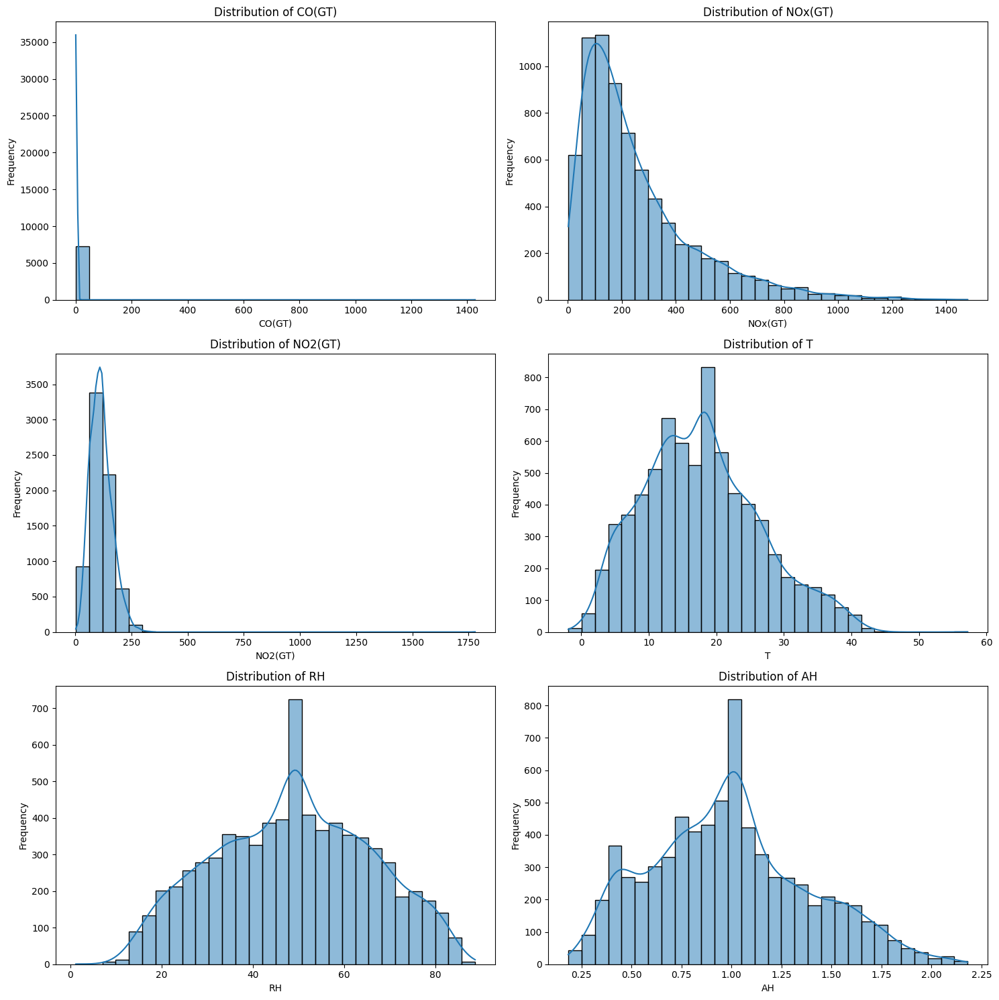

In [ ]:
# Proceed with distribution plots for selected variables
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))
variables_to_plot = ['CO(GT)', 'NOx(GT)', 'NO2(GT)', 'T', 'RH', 'AH']

for ax, var in zip(axs.flat, variables_to_plot):
    # Temporarily convert to numeric, ignoring errors to bypass -200 and other non-numeric issues
    sns.histplot(pd.to_numeric(df[var], errors='coerce'), bins=30, ax=ax, kde=True)
    ax.set_title(f'Distribution of {var}')
    ax.set_ylabel('Frequency')
    ax.set_xlabel(var)

plt.tight_layout()
plt.show()

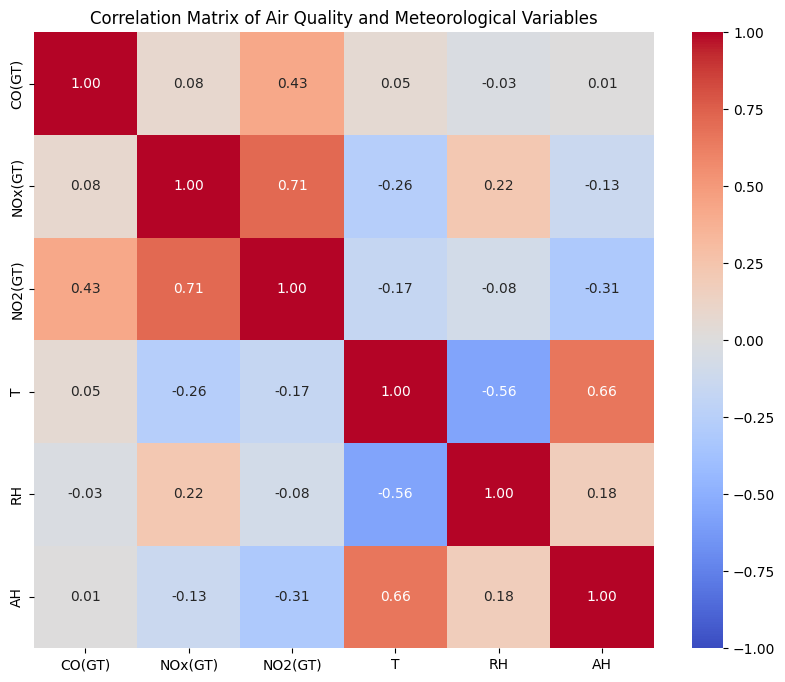

In [ ]:
numeric_columns = ['CO(GT)', 'NOx(GT)', 'NO2(GT)', 'T', 'RH', 'AH']
df_numeric = df[numeric_columns].apply(pd.to_numeric, errors='coerce')

# Calculate correlation matrix
correlation_matrix = df_numeric.corr()

# Plotting the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix of Air Quality and Meteorological Variables')
plt.show()

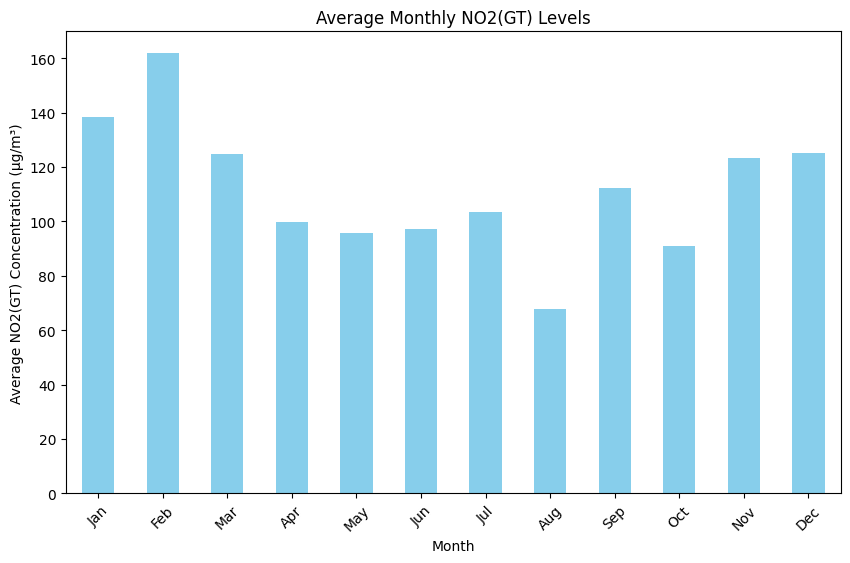

In [ ]:
# Additionally, let's look into temporal trends for one of the pollutants, say NO2(GT), across different months.
# Due to previous issues with datetime conversion, we'll use the 'Date' column as is, extracting the month for grouping.

# Extract month from the 'Date' column (assuming format DD/MM/YYYY)
df['Month'] = df['Date'].apply(lambda x: int(x.split('/')[1]) if pd.notna(x) else pd.NA)

# Group by month and calculate average NO2(GT) levels
monthly_no2 = df.groupby('Month')['NO2(GT)'].mean().dropna()

# Plotting the average NO2(GT) levels by month
plt.figure(figsize=(10, 6))
monthly_no2.plot(kind='bar', color='skyblue')
plt.title('Average Monthly NO2(GT) Levels')
plt.xlabel('Month')
plt.ylabel('Average NO2(GT) Concentration (µg/m³)')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
plt.show()

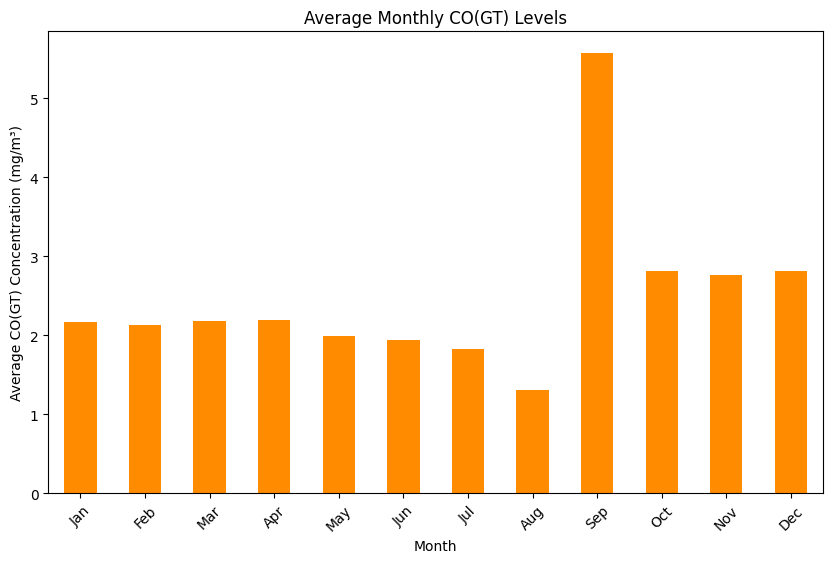

In [ ]:
# To delve deeper into the analysis of Carbon Monoxide (CO) levels, let's examine:
# 1. Temporal trends of CO levels across different months.
# 2. The relationship between CO levels and temperature (T), as temperature could influence the dispersion of pollutants.

# Extracting month from 'Date' for grouping, similar to the NO2 analysis, if not already done
if 'Month' not in df:
    df['Month'] = df['Date'].apply(lambda x: int(x.split('/')[1]) if pd.notna(x) else pd.NA)

# Group by month and calculate average CO(GT) levels
monthly_co = df.groupby('Month')['CO(GT)'].mean().dropna()

# Plotting the average CO(GT) levels by month
plt.figure(figsize=(10, 6))
monthly_co.plot(kind='bar', color='darkorange')
plt.title('Average Monthly CO(GT) Levels')
plt.xlabel('Month')
plt.ylabel('Average CO(GT) Concentration (mg/m³)')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
plt.show()

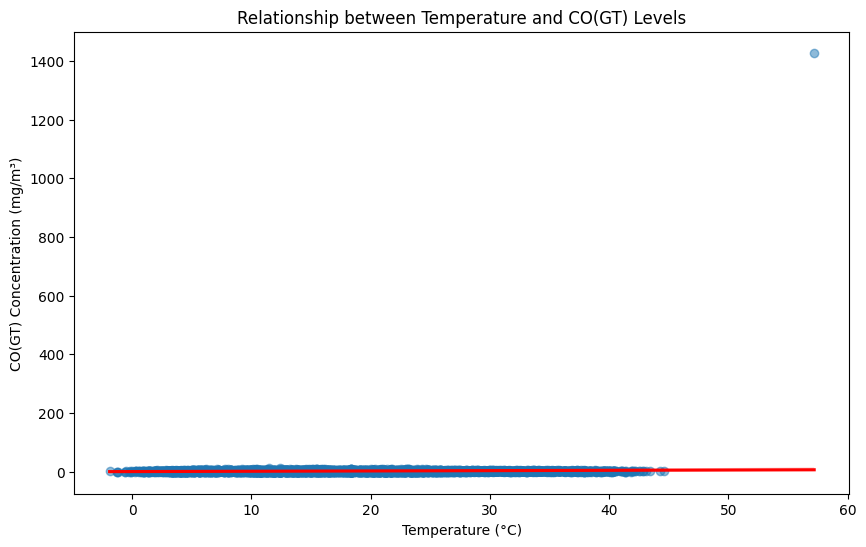

In [ ]:
# Exploring the relationship between CO levels and Temperature
# Creating a scatter plot with a regression line to visualize this relationship
plt.figure(figsize=(10, 6))
sns.regplot(x='T', y='CO(GT)', data=df_numeric, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Relationship between Temperature and CO(GT) Levels')
plt.xlabel('Temperature (°C)')
plt.ylabel('CO(GT) Concentration (mg/m³)')
plt.show()

In [ ]:
pip install pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 14.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=9ab2a961eb5a576459f933f81e1a35e116cec3236bbb34d4248fbfce2413fc12
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [ ]:
pip install pydantic-settings

In [ ]:
pip install --upgrade pydantic

In [ ]:
pip install --upgrade pandas_profiling

In [ ]:
pip install ydata-profiling

In [ ]:
from ydata_profiling import ProfileReport

In [ ]:
profile = df.profile_report(title='Air Quality Dataset Analysis')
profile.to_file("Air_Quality_analysis.html")

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:354: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
from IPython.display import display, HTML

display(HTML("Air_Quality_analysis.html"))

Number of variables,15
Number of observations,7259
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,1.1 MiB
Average record size in memory,164.4 B
DateTime,1
Categorical,1
Numeric,13


In [ ]:
import sweetviz as sv

In [ ]:
report = sv.analyze(df)


                                             |          | [  0%]   00:00 -> (? left)

In [ ]:
from IPython.display import IFrame

report.show_html('report.html')

Report report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



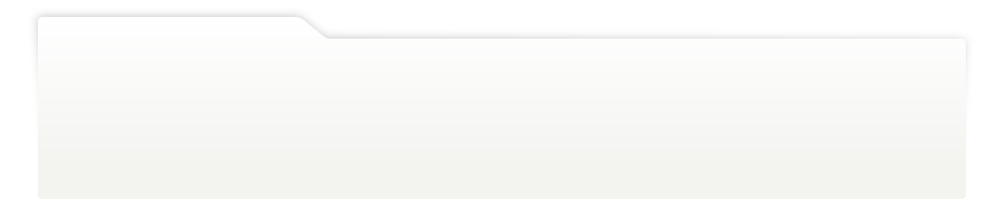
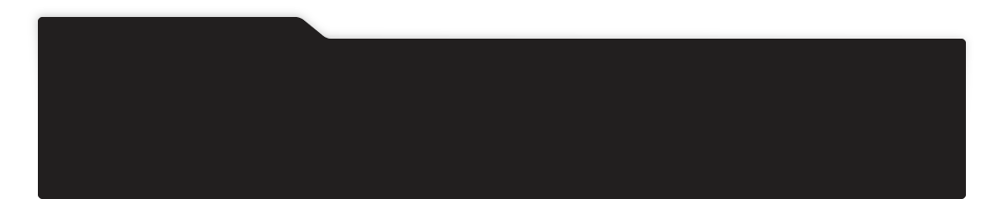
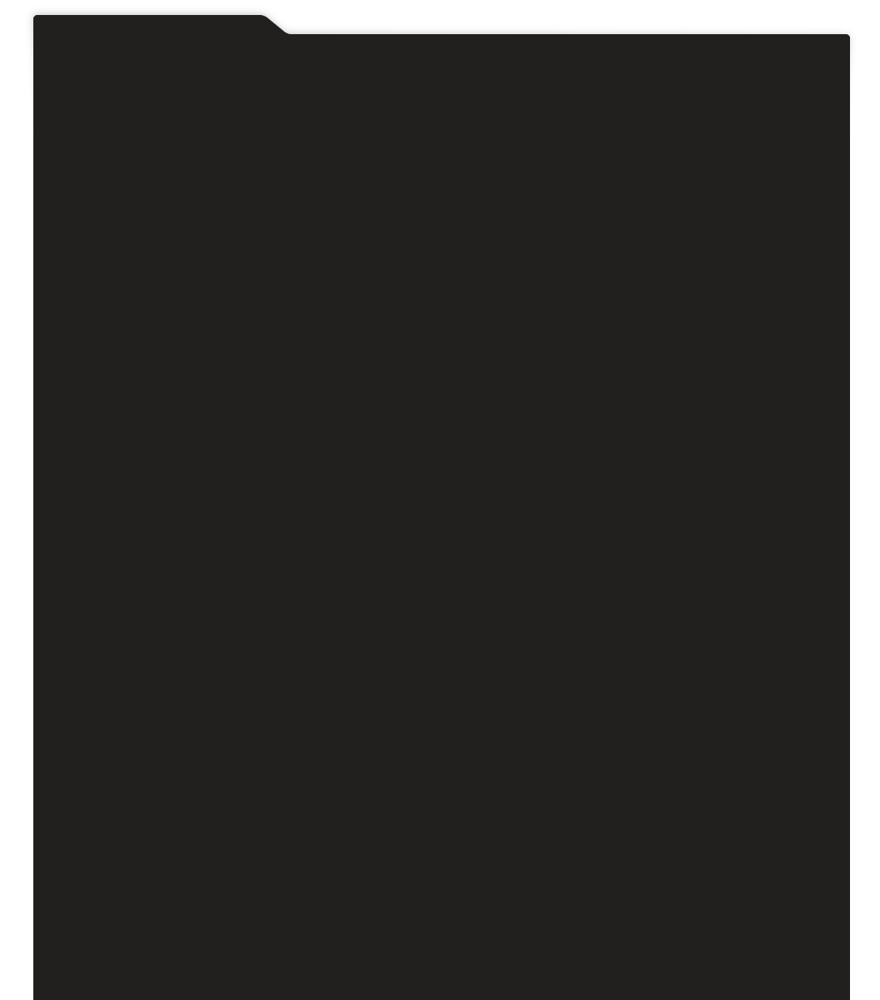
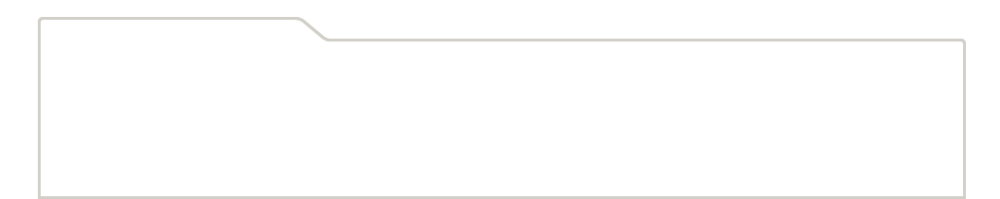
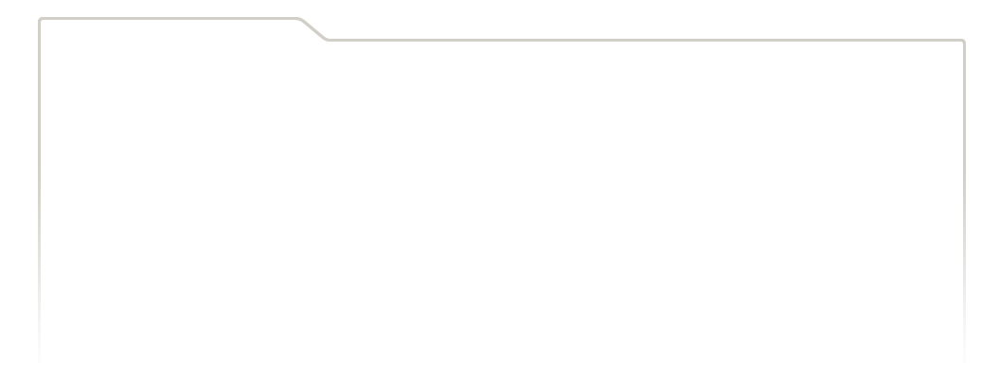
...
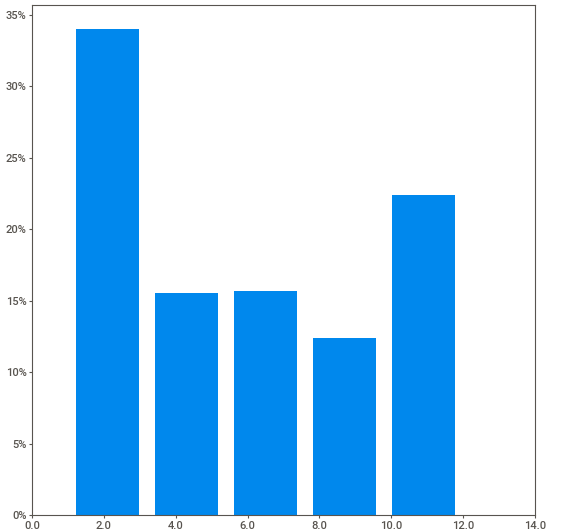
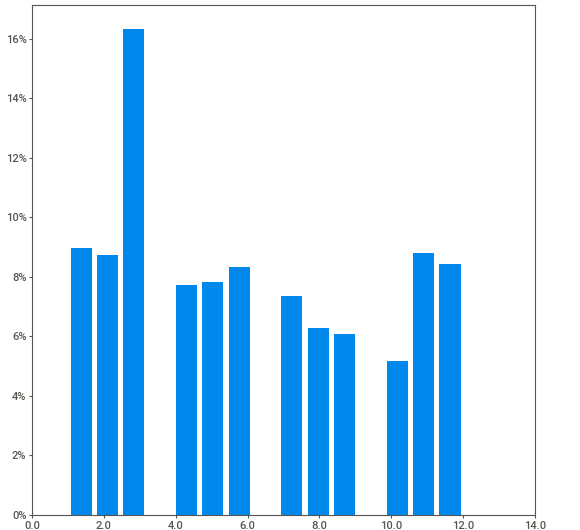
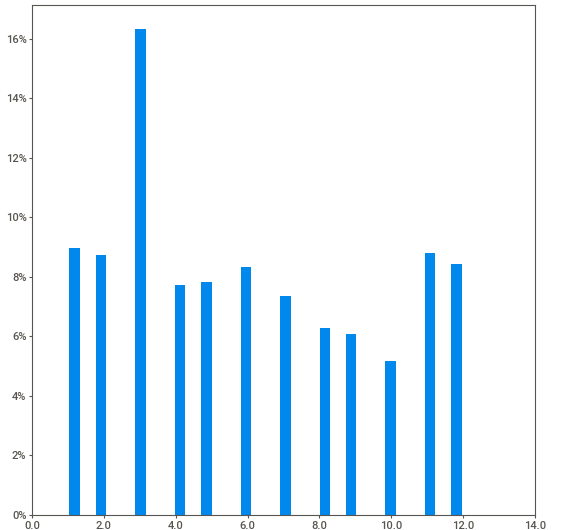
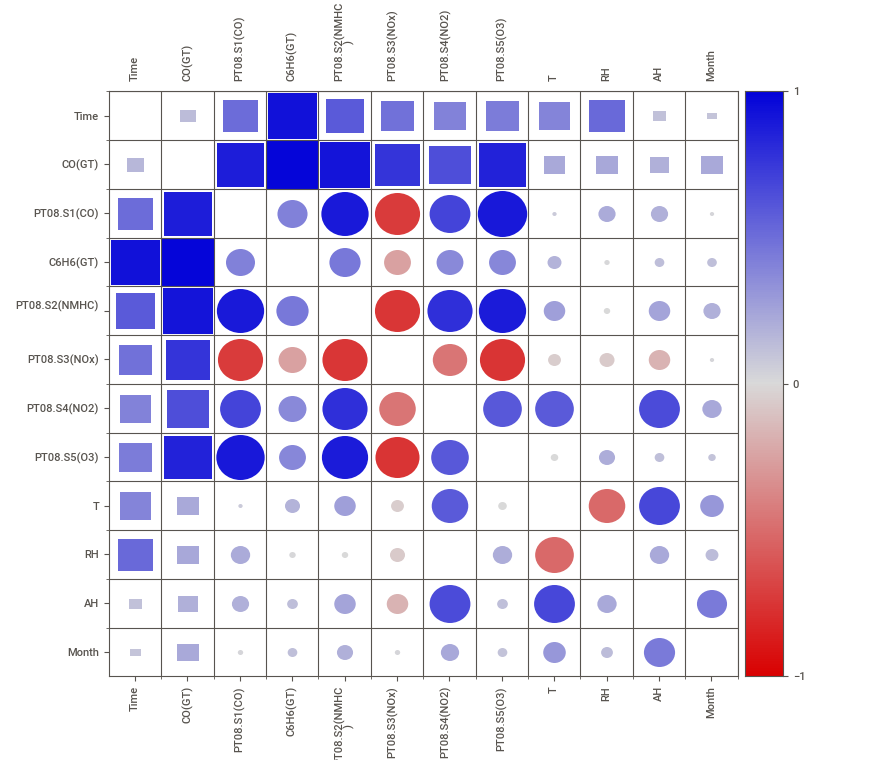
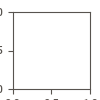

In [ ]:
display(HTML("report.html"))

In [ ]:
df = df.dropna()

In [ ]:
df.isnull().sum()

Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
Month            0
datetime         0
dtype: int64

#### Convering the object columns to float for analysis

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7258 entries, 0 to 9356
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           7258 non-null   object        
 1   Time           7258 non-null   object        
 2   CO(GT)         7258 non-null   object        
 3   PT08.S1(CO)    7258 non-null   float64       
 4   C6H6(GT)       7258 non-null   float64       
 5   PT08.S2(NMHC)  7258 non-null   float64       
 6   NOx(GT)        7258 non-null   object        
 7   PT08.S3(NOx)   7258 non-null   float64       
 8   NO2(GT)        7258 non-null   object        
 9   PT08.S4(NO2)   7258 non-null   float64       
 10  PT08.S5(O3)    7258 non-null   float64       
 11  T              7258 non-null   float64       
 12  RH             7258 non-null   float64       
 13  AH             7258 non-null   float64       
 14  Month          7258 non-null   int64         
 15  datetime       7258 non-nu

In [ ]:
# List of columns to convert to float
columns_to_convert = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
       'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
       'T', 'RH', 'AH']

# Convert columns to float using a for loop
for col in columns_to_convert:
    df[col] = df[col].astype(float)

<ipython-input-48-a441f16a7250>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype(float)
<ipython-input-48-a441f16a7250>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype(float)
<ipython-input-48-a441f16a7250>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7258 entries, 0 to 9356
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           7258 non-null   object        
 1   Time           7258 non-null   object        
 2   CO(GT)         7258 non-null   float64       
 3   PT08.S1(CO)    7258 non-null   float64       
 4   C6H6(GT)       7258 non-null   float64       
 5   PT08.S2(NMHC)  7258 non-null   float64       
 6   NOx(GT)        7258 non-null   float64       
 7   PT08.S3(NOx)   7258 non-null   float64       
 8   NO2(GT)        7258 non-null   float64       
 9   PT08.S4(NO2)   7258 non-null   float64       
 10  PT08.S5(O3)    7258 non-null   float64       
 11  T              7258 non-null   float64       
 12  RH             7258 non-null   float64       
 13  AH             7258 non-null   float64       
 14  Month          7258 non-null   int64         
 15  datetime       7258 non-nu

### Resample the data to a daily frequency, aggregating with the mean  

In [ ]:
## Dropping extra columns

df = df.drop('Date', axis=1)
df = df.drop('Time', axis=1)

In [ ]:
# Resample data to daily frequency, aggregating with mean
df.set_index('datetime', inplace=True)
data_daily = df.resample('D').mean()

In [ ]:
df.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Month
datetime,,,,,,,,,,,,,
2004-03-10 18:00:00,2.6,1360.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,3
2004-03-10 19:00:00,2.0,1292.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,3
2004-03-10 20:00:00,2.2,1402.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,3
2004-03-10 21:00:00,2.2,1376.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,3
2004-03-10 22:00:00,1.6,1272.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,3


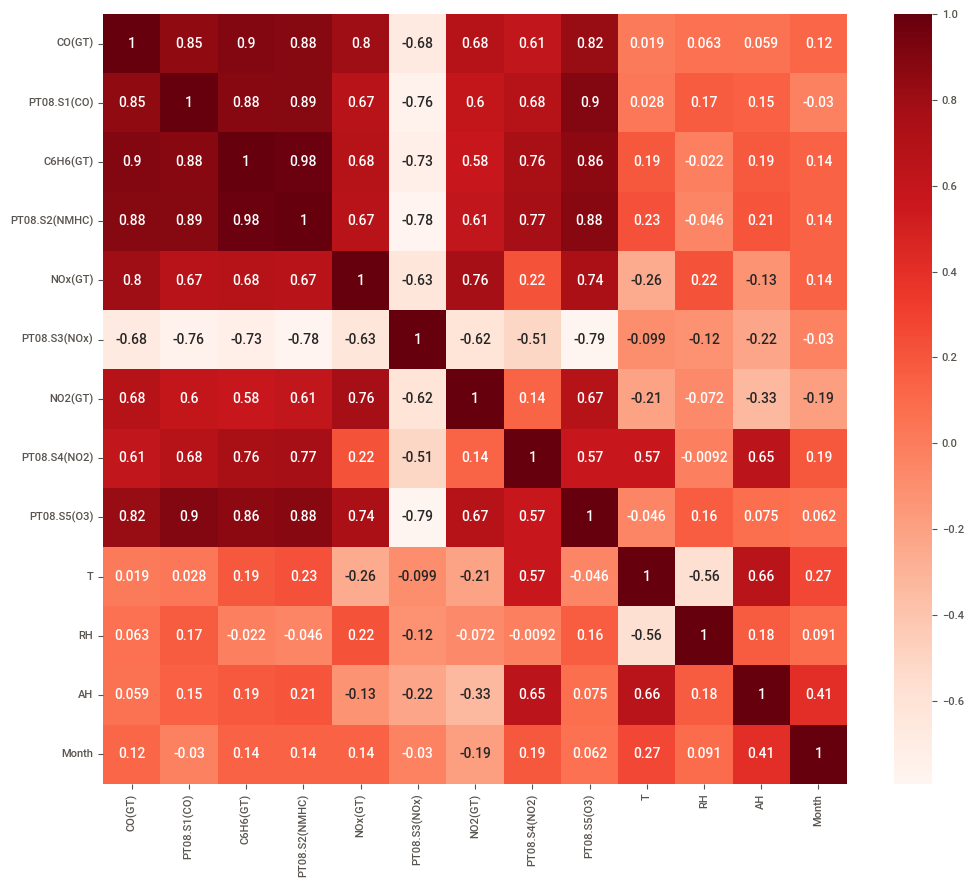

In [ ]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

Text(0.5, 1.0, 'NOx & sensor S5(NOx)')

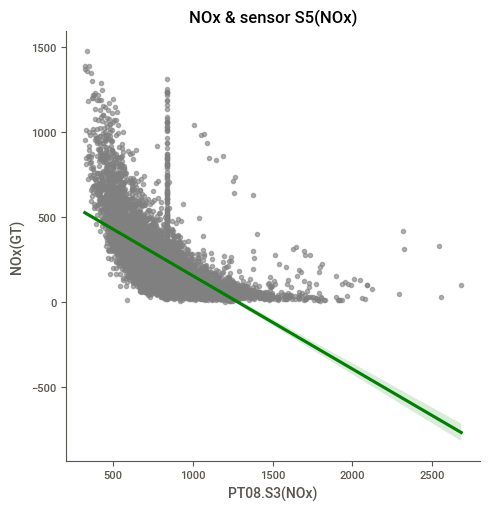

In [ ]:
# NOx vs. S5(NOx)
sns.lmplot(x='PT08.S3(NOx)',y='NOx(GT)', scatter_kws={'color':'grey','alpha':.6}, data=df,line_kws={'color':'green'})
plt.title("NOx & sensor S5(NOx)")

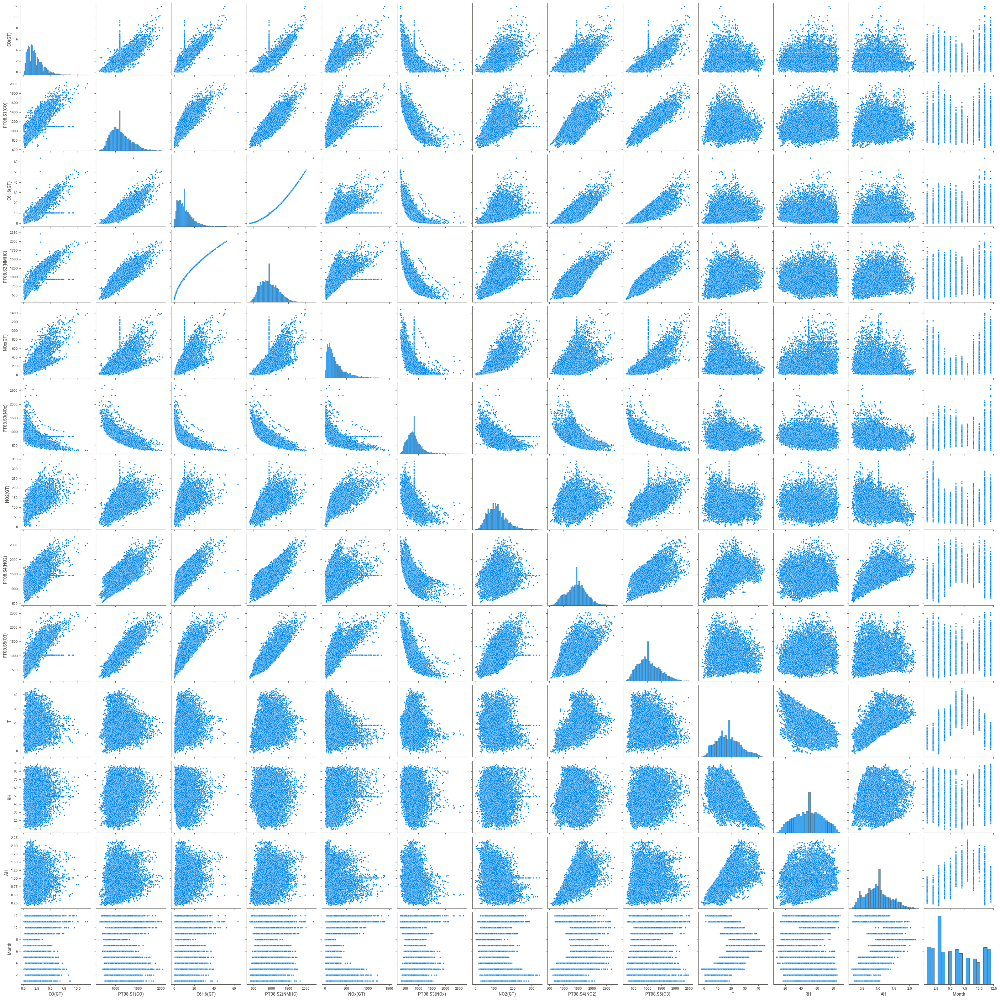

In [ ]:
sns.pairplot(df)